In [1]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [2]:
class ImageDataset0(Dataset):
    def __init__(self, prefix):
        self.imgs = []
        for suffix in ['0', '1', '2', '3']:
            filename = prefix+'-'+suffix+'.png'
            img = Image.open(filename).convert('RGB')
            img = np.array(img, dtype=np.float32) / 255.0
            img = img[:img.shape[0]//16*16, :img.shape[1]//16*16, :]
            img = np.einsum('abn->nab', img)
            print(filename, img.shape)
            self.imgs.append(img)
        self.ress = [self.imgs[3]]*4

    def __len__(self):
        return len(self.imgs)
    
    def __getitem__(self, i):
        return [
            torch.tensor(self.imgs[i]).to(device),
            torch.tensor(self.ress[i]).to(device)
        ]


class ImageDataset(ImageDataset0):
    def __init__(self):
        import json
        with open("data-implicit3-alpha-field.json", "r") as fp:
            content = json.load(fp)
        self.imgs = []
        self.ress = []
        for img in content:
            src = self.decode_img(img[0])
            # src = self.decode_img(img[1])
            noise = np.random.normal(size=src.shape[1:3])
            # src *= [np.exp(1.0*noise)]*3
            src *= [1.0+0.5*noise]*3
            self.imgs.append(src)
            self.ress.append(self.decode_img(img[1]))
    
    @staticmethod
    def decode_img(b64):
        import base64
        from io import BytesIO
        b64 = b64[b64.find(',')+1:]
        img = Image.open(BytesIO(base64.b64decode(b64)))
        img = np.array(img.convert("RGB"))
        img = np.array(img, dtype=np.float32) / 255.0
        img = img[:img.shape[0]//16*16, :img.shape[1]//16*16, :]
        img = np.einsum('abn->nab', img)
        return img

traindata = list(DataLoader(
    # ImageDataset0("train"),
    ImageDataset(),
    batch_size=4
))
for ref, res in traindata:
    print(ref.shape)
    print(res.shape)
    break


torch.Size([4, 3, 256, 256])
torch.Size([4, 3, 256, 256])


In [3]:
# https://github.com/OpenImageDenoise/oidn/blob/master/training/model.py

def conv(n_in, n_out):
    return nn.Conv2d(n_in, n_out, 3, padding=1)

def conv1(n_in, n_out):
    return nn.Conv2d(n_in, n_out, 1, padding=0)

def relu(x):
    return F.relu(x, inplace=True)

def pool(x):
  return F.max_pool2d(x, 2, 2)

def upsample(x):
  return F.interpolate(x, scale_factor=2, mode='nearest')

def concat(a, b):
  return torch.cat((a, b), 1)

class Model1(nn.Module):
    def __init__(self, nin=3, nout=3):
        super().__init__()
        ec0 = 4
        ec1 = 16
        ec2 = 16
        ec3 = 16
        ec4 = 16
        ec5 = 16
        ec6 = 16
        dc4 = 16
        dc3 = 16
        dc2 = 16
        dc1 = 8
        self.econv0 = conv(nin, ec0)
        self.econv1 = conv(ec0, ec1)
        self.econv2 = conv(ec1, ec2)
        self.econv3 = conv(ec2, ec3)
        self.econv4 = conv(ec3, ec4)
        self.econv5a = conv(ec4, ec5)
        self.econv5b = conv(ec5, ec6)
        self.dconv4a = conv(ec6+ec3, dc4)
        self.dconv4b = conv(dc4, dc4)
        self.dconv3a = conv(dc4+ec2, dc3)
        self.dconv3b = conv(dc3, dc3)
        self.dconv2a = conv(dc3+ec1, dc2)
        self.dconv2b = conv(dc2, dc2)
        self.dconv1a = conv(dc2+nin, dc1)
        self.dconv1b = conv(dc1, dc1)
        self.dconv0 = conv(dc1, nout)

    def forward(self, input):
        x = input
        x = relu(self.econv0(x))  # (ec1, 1)
        x = relu(self.econv1(x))  # (ec1, 1)
        x = pool1 = pool(x)  # (ec1, 1/2)
        x = relu(self.econv2(x))  # (ec2, 1/2)
        x = pool2 = pool(x)  # (ec2, 1/4)
        x = relu(self.econv3(x))  # (ec3, 1/4)
        x = pool3 = pool(x)  # (ec3, 1/8)
        x = relu(self.econv4(x))  # (ec4, 1/8)
        x = pool(x)  # (ec4, 1/16)
        x = relu(self.econv5a(x))  # (ec5, 1/16)
        x = relu(self.econv5b(x))  # (ec6, 1/16)
        x = upsample(x)  # (ec6, 1/8)
        x = concat(x, pool3)  # (ec6+ec3, 1/8)
        x = relu(self.dconv4a(x))  # (dc4, 1/8)
        x = relu(self.dconv4b(x))  # (dc4, 1/8)
        x = upsample(x)  # (dc4, 1/4)
        x = concat(x, pool2)  # (dc4+ec2, 1/4)
        x = relu(self.dconv3a(x))  # (dc3, 1/4)
        x = relu(self.dconv3b(x))  # (dc3, 1/4)
        x = upsample(x)  # (dc3, 1/2)
        x = concat(x, pool1)  # (dc3+ec1, 1/2)
        x = relu(self.dconv2a(x))  # (dc2, 1/2)
        x = relu(self.dconv2b(x))  # (dc2, 1/2)
        x = upsample(x)  # (dc2, 1)
        x = concat(x, input)  # (dc2+nin, 1)
        x = relu(self.dconv1a(x))  # (dc1, 1)
        x = F.tanh(self.dconv1b(x))  # (dc1, 1)
        x = self.dconv0(x)  # (nout, 1)
        return x

model = Model1().to(device)
print(model)
print(device)

Model1(
  (econv0): Conv2d(3, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (econv1): Conv2d(4, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (econv2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (econv3): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (econv4): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (econv5a): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (econv5b): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (dconv4a): Conv2d(32, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (dconv4b): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (dconv3a): Conv2d(32, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (dconv3b): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (dconv2a): Conv2d(32, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (dconv2b): Conv2d(16, 16, kernel_size=(3, 3), stri

C:\Users\harry\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
C:\Users\harry\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SqueezeNet1_1_Weights.IMAGENET1K_V1`. You can also use `weights=SqueezeNet1_1_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


50 0.18508490920066833


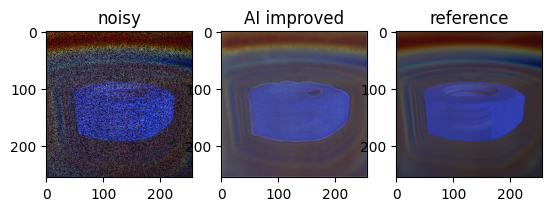

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


100 0.19724252820014954


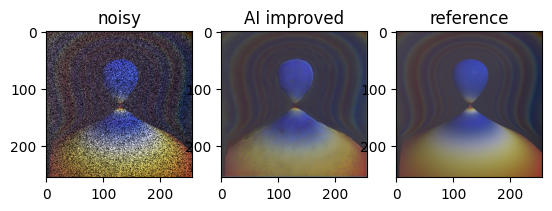

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


150 0.2173198163509369


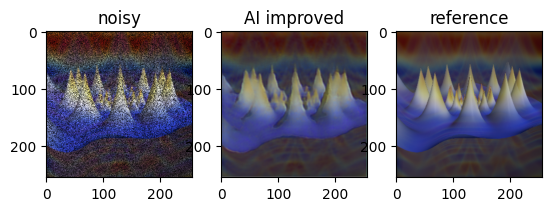

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


250 0.09135477989912033


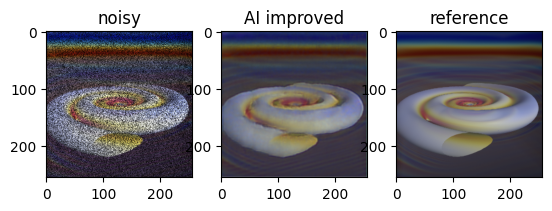

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


300 0.08171572536230087


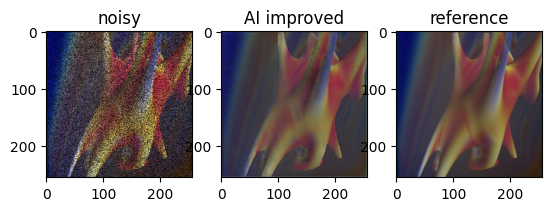

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


350 0.04716493561863899


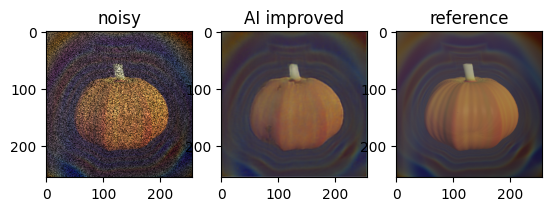

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


450 0.10229044407606125


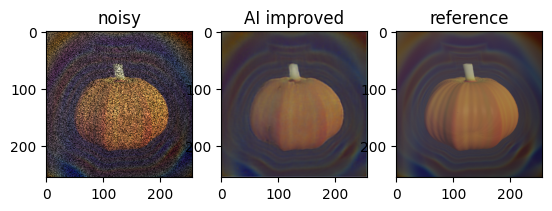

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


500 0.05012885853648186


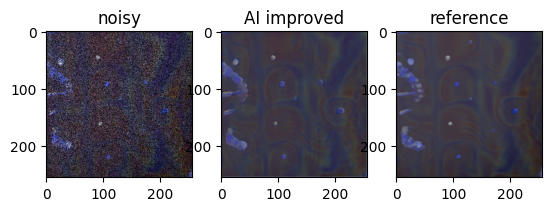

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


550 0.0671137124300003


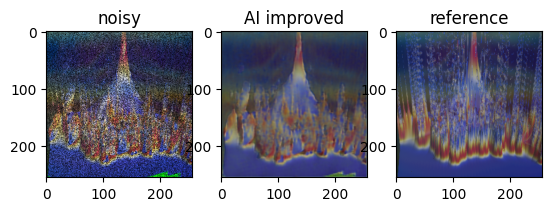

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


650 0.03957836702466011


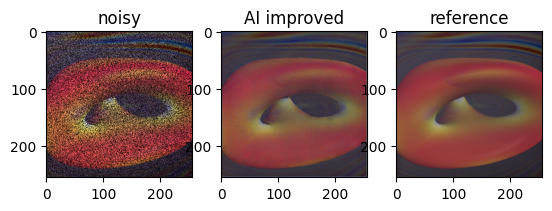

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


700 0.0639752447605133


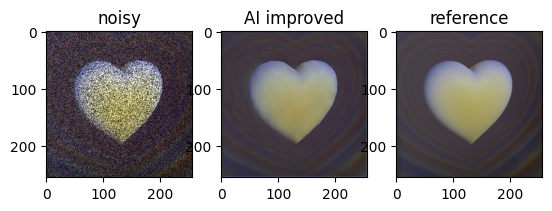

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


750 0.08230047672986984


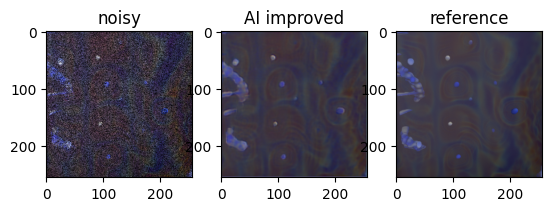

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


850 0.14497247338294983


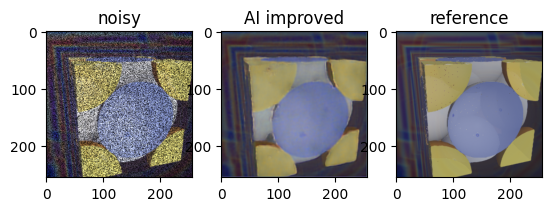

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


900 0.24163614213466644


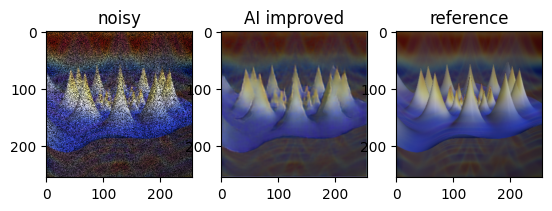

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


950 0.07161436229944229


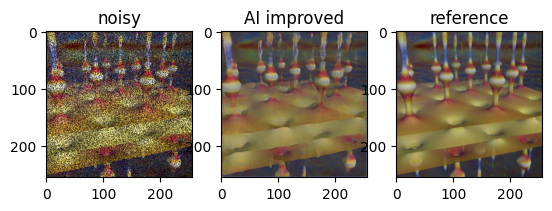

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1100 0.06582001596689224


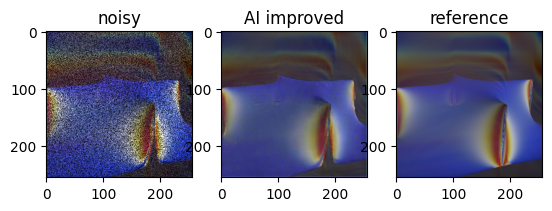

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1300 0.0711711049079895


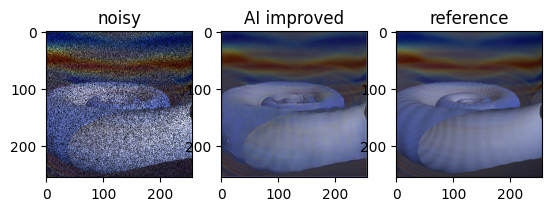

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1500 0.04321562498807907


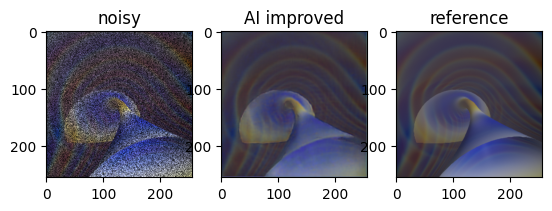

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1700 0.06624367088079453


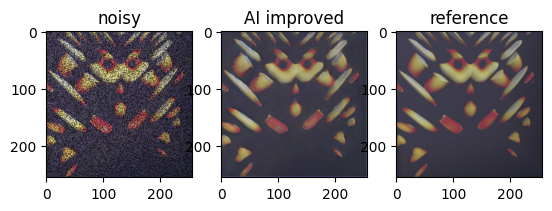

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1900 0.03633368760347366


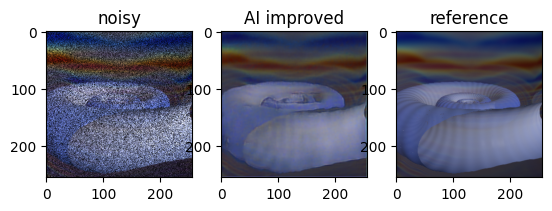

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2100 0.07822674512863159


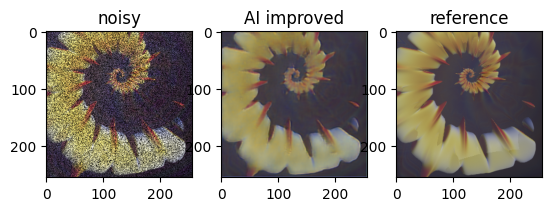

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2300 0.17227062582969666


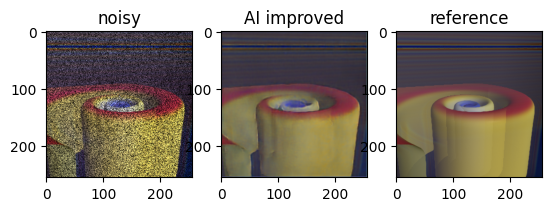

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2500 0.060403503477573395


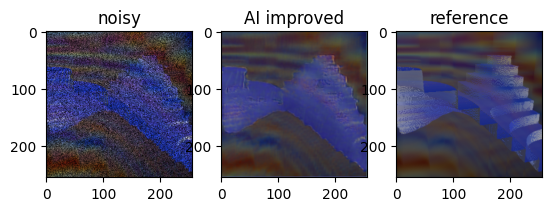

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2700 0.0546402633190155


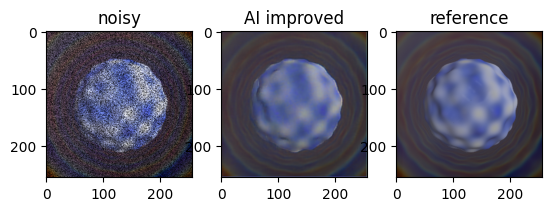

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2900 0.16361203789710999


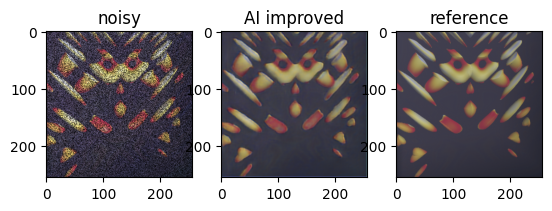

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3100 0.039888542145490646


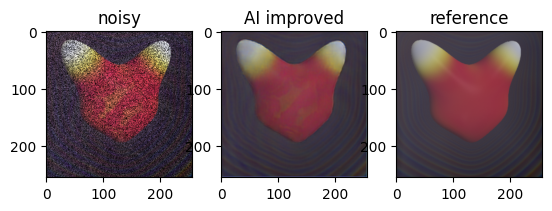

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3300 0.033012233674526215


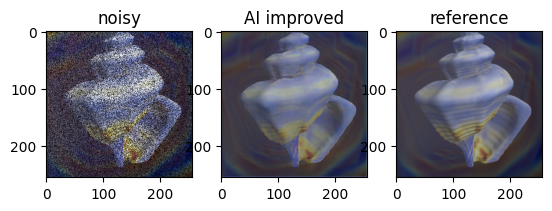

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3500 0.055060550570487976


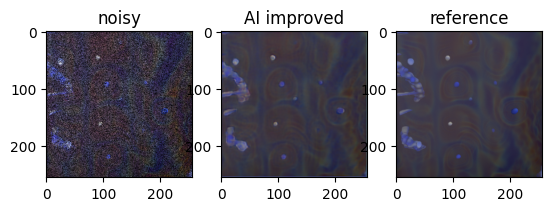

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3700 0.057095952332019806


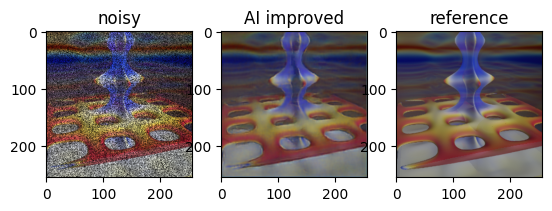

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3900 0.047734059393405914


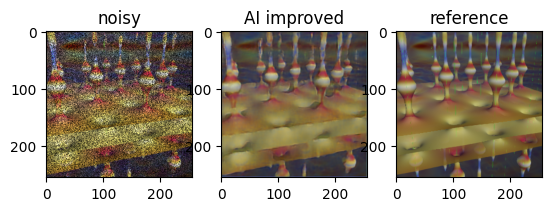

In [4]:
from lpips_pytorch import LPIPS, lpips
from random import shuffle, randint

def preproc(img):
    return img-0.5

def postproc(img):
    return 0.5+img

optimizer = torch.optim.Adam(
    model.parameters(),
    lr=0.0002
)

criterion = LPIPS(
    net_type='squeeze',
    version='0.1'
).to(device)
traindata = list(traindata)
loss = criterion(
    traindata[0][1],
    model(traindata[0][0])
)

dataset = ImageDataset()

for epoch in range(4000):
    traindata = DataLoader(
        dataset,
        batch_size=4,
        shuffle=True
    )
    for imgsrc, imgres in traindata:
        optimizer.zero_grad()
        output = postproc(model(preproc(imgsrc)))
        loss = lpips(imgres, output, net_type='squeeze', version='0.1')
        loss.backward()
        optimizer.step()
    if epoch % 200 ==  100 or (epoch < 1000 and epoch % 100 == 50):
        print(epoch, loss.item())
        imgsrc, imgres = list(traindata)[0]
        with torch.no_grad():
            imgcmp = postproc(model(preproc(imgsrc)))
        fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
        i = randint(0, len(imgsrc)-1)
        ax1.set_title("noisy")
        ax1.imshow(imgsrc[i].permute(1, 2, 0).cpu().numpy())
        ax2.set_title("AI improved")
        ax2.imshow(imgcmp[i].permute(1, 2, 0).cpu().numpy())
        ax3.set_title("reference")
        ax3.imshow(imgres[i].permute(1, 2, 0).cpu().numpy())
        plt.show()



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.032507557421922684


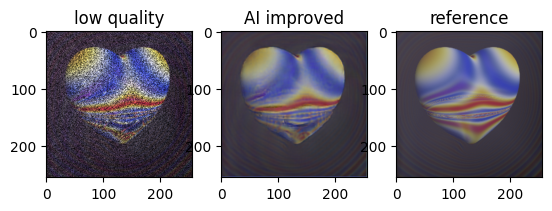

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.013065463863313198


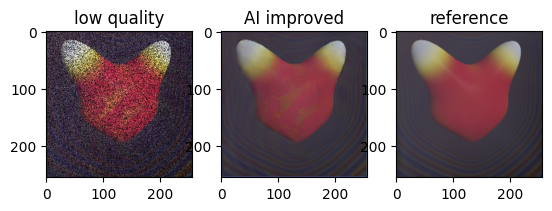

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.02249414473772049


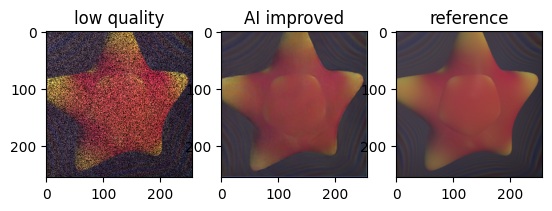

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.013174459338188171


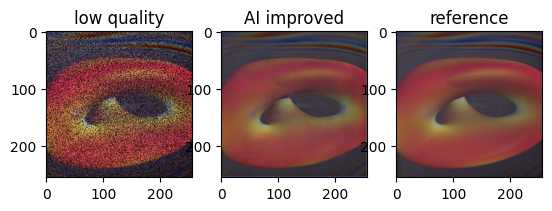

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.02391243167221546


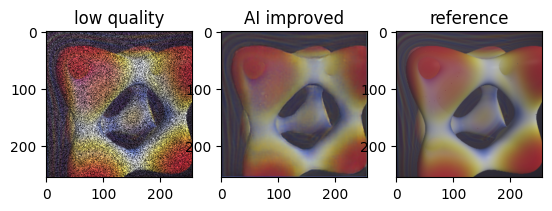

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.022314339876174927


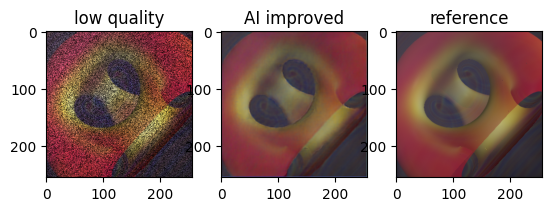

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.011870061047375202


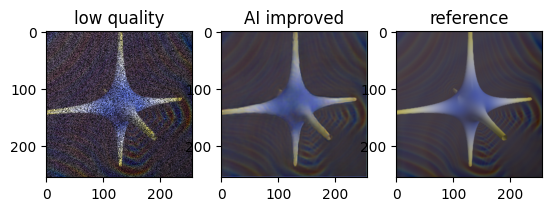

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.016805484890937805


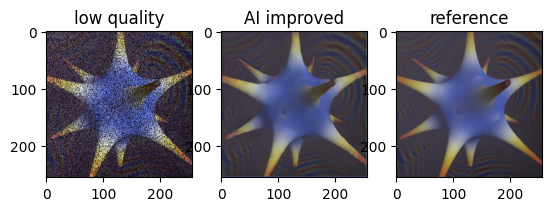

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.015722909942269325


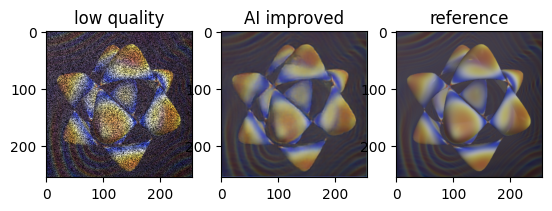

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.01227976568043232


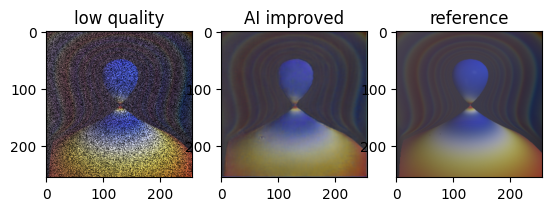

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.012664617970585823


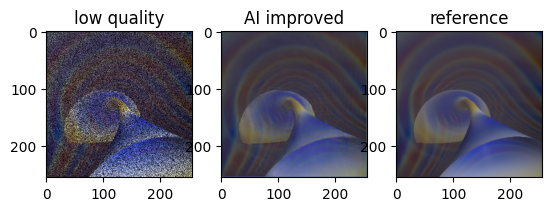

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.016280557960271835


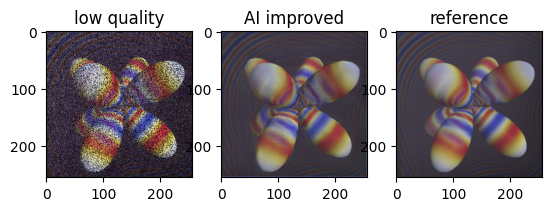

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.009367968887090683


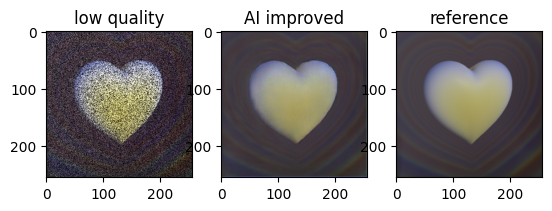

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.010727331973612309


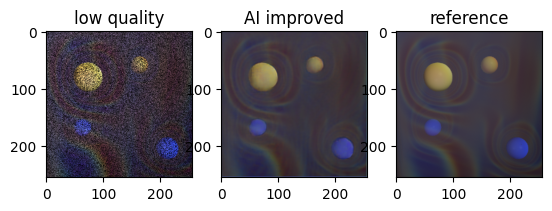

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.014171293005347252


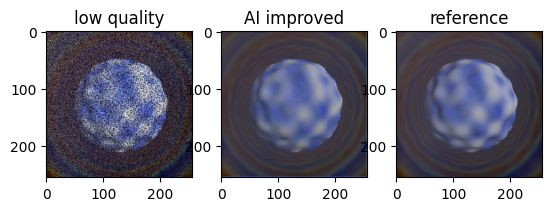

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.016835378482937813


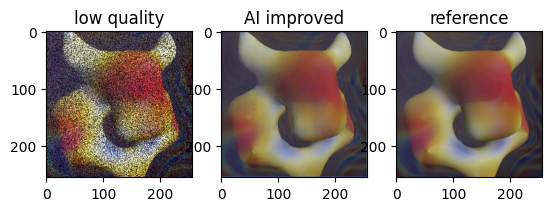

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.073830246925354


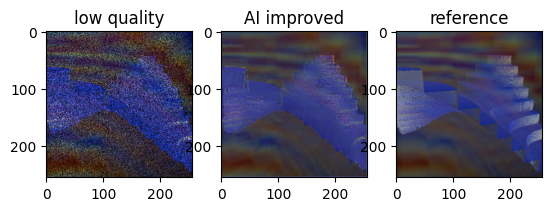

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.026889637112617493


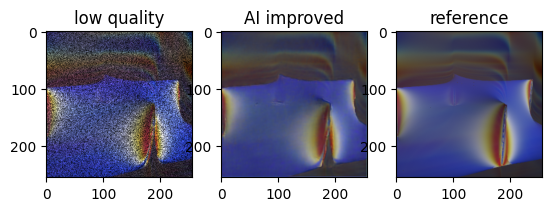

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.02426978200674057


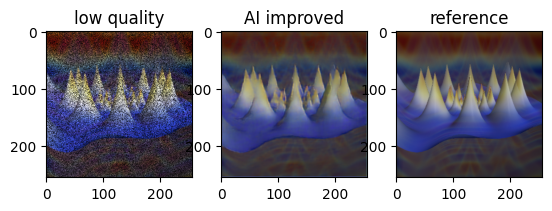

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.03453787788748741


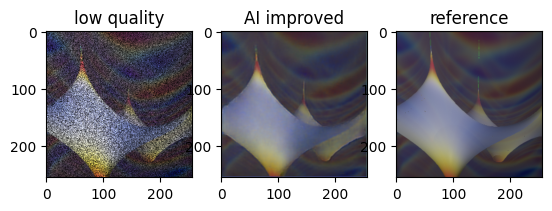

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.057175733149051666


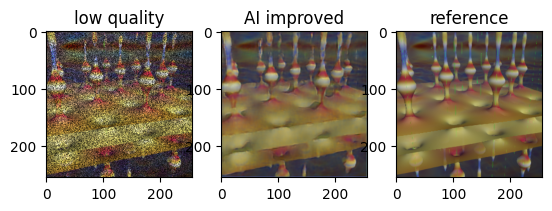

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.014608368277549744


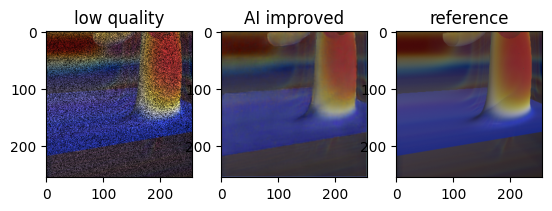

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.026176659390330315


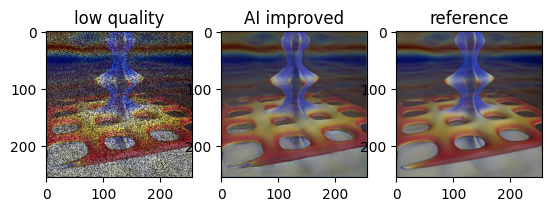

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.024611283093690872


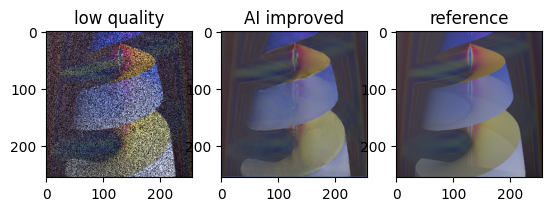

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.02366531640291214


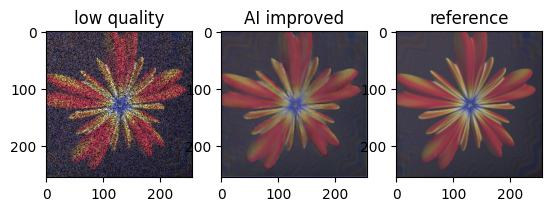

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.021108146756887436


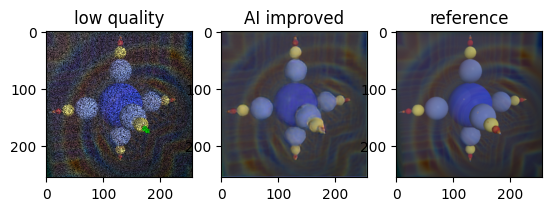

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.06593161821365356


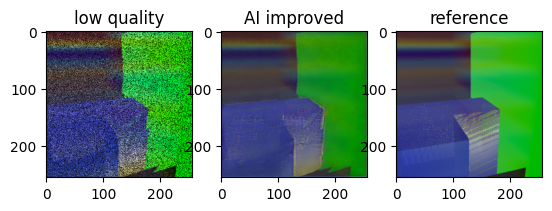

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.03433829918503761


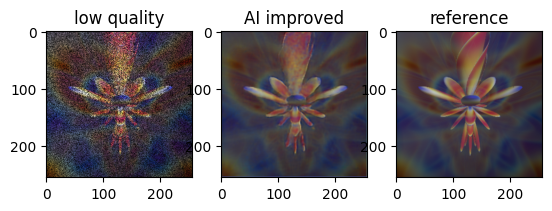

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.01616271212697029


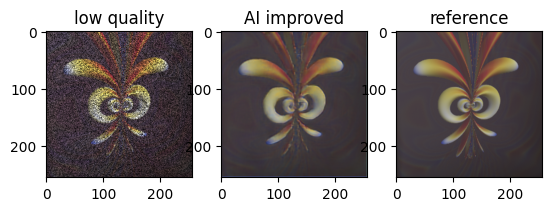

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.01597069576382637


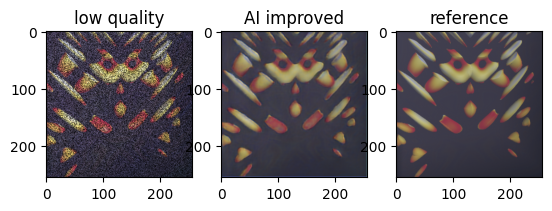

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.013411563821136951


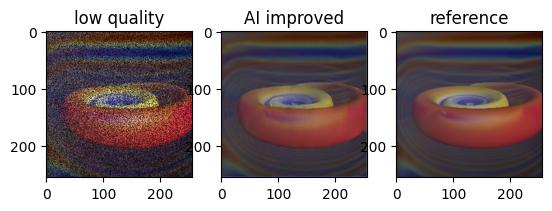

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.017814353108406067


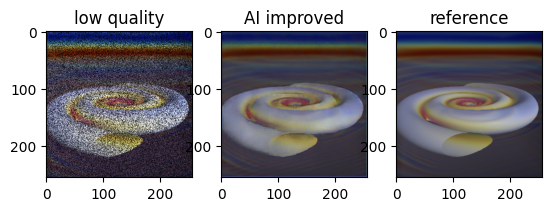

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.010670851916074753


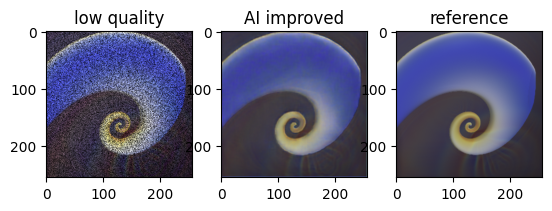

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.020053856074810028


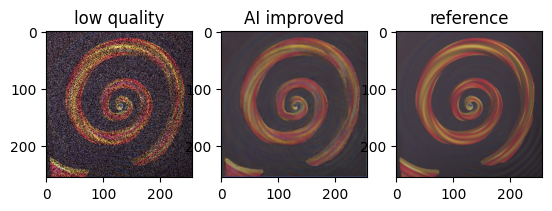

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.028471678495407104


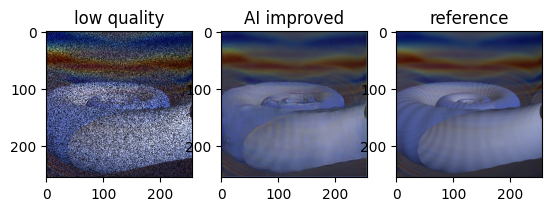

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.03636113554239273


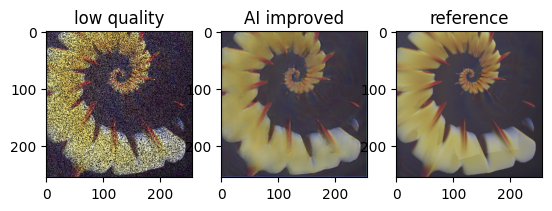

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.025433575734496117


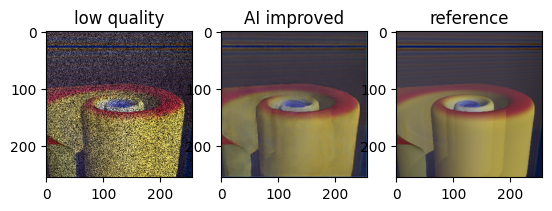

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.04305419325828552


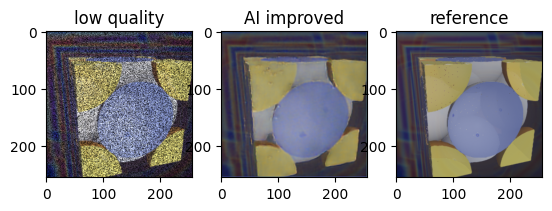

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.013712674379348755


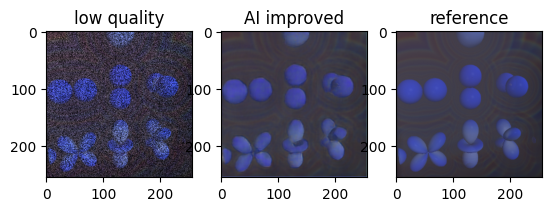

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.030095482245087624


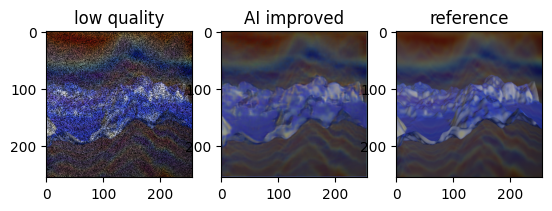

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.020026318728923798


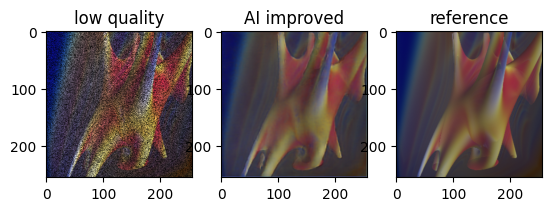

0.019397763535380363

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


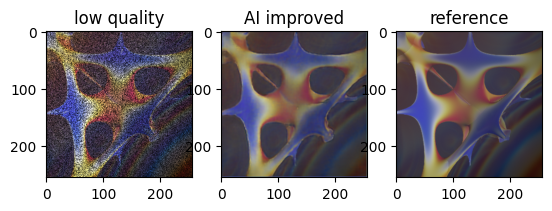

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.030652878805994987


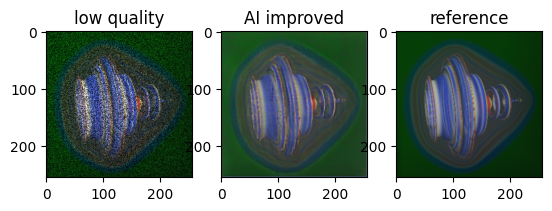

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.10751231014728546


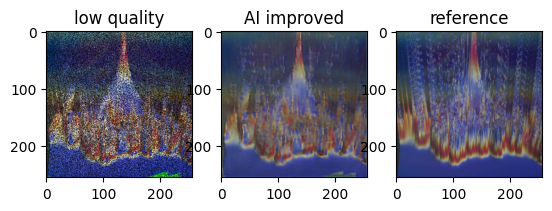

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.09499695897102356


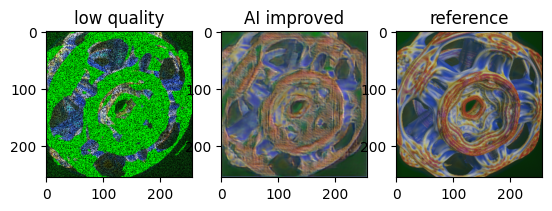

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.01365000382065773


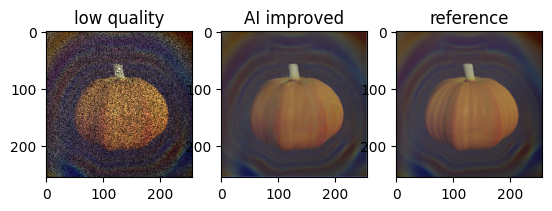

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.017377935349941254


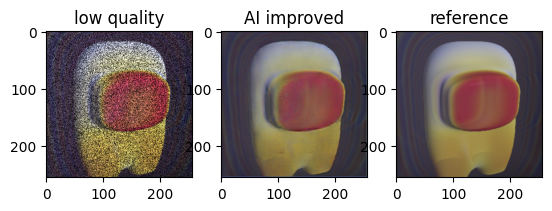

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.01856067404150963


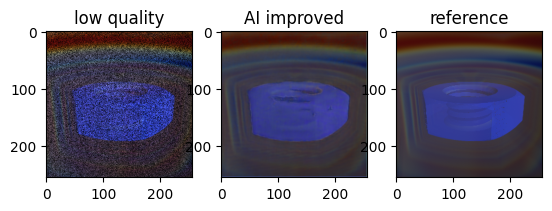

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.047644589096307755


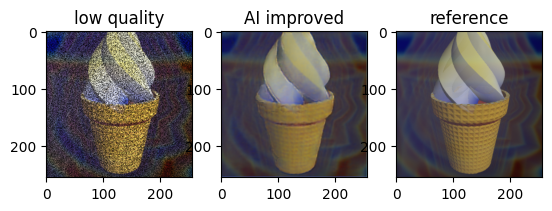

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.018368709832429886


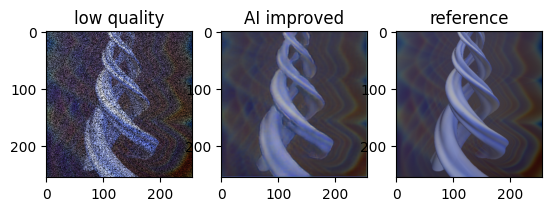

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.02985144779086113


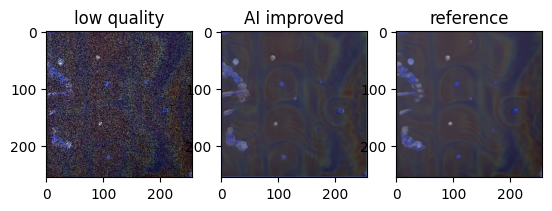

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.028012065216898918


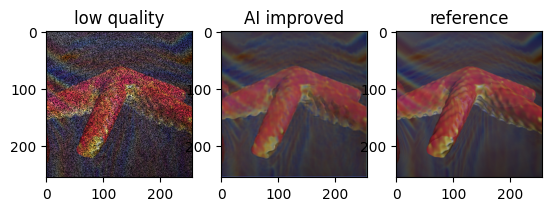

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.01775999180972576


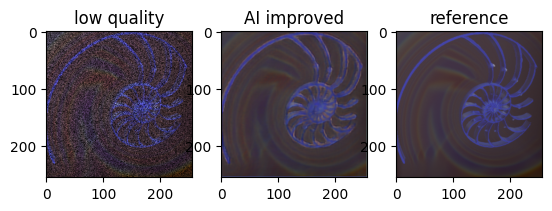

0.02853287011384964

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


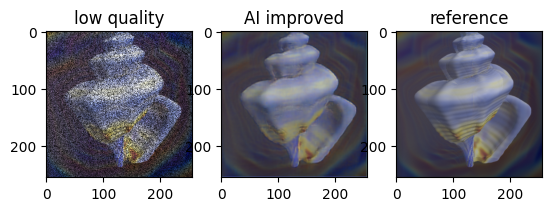

In [5]:
for imgsrc, imgres in DataLoader(
    dataset,
    batch_size=1,
    shuffle=False
):
    with torch.no_grad():
        output = postproc(model(preproc(imgsrc)))
        loss = lpips(imgres, output, net_type='squeeze', version='0.1')
        print(loss.item())
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
    i = 0
    ax1.set_title("low quality")
    ax1.imshow(imgsrc[i].permute(1, 2, 0).cpu().numpy())
    ax2.set_title("AI improved")
    ax2.imshow(output[i].permute(1, 2, 0).cpu().numpy())
    ax3.set_title("reference")
    ax3.imshow(imgres[i].permute(1, 2, 0).cpu().numpy())
    plt.show()

In [12]:
torch.save(model, "main.pth")